<a href="https://colab.research.google.com/github/johnnycleiton07/closed-space-PYGAME/blob/master/CinUFPE_pdi04_Spatial_Filtering_01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**2023.1 Especialização em Robótica: Processamento de Imagens**
# **Filtragem e Detecção de Bordas (PT1)**
> **Monitoria 03.1 - PDI04** - Macela Zovka de Moraes Lemos

**Objetivo ~~~**
Este notebook tem por objetivo exemplificar os conteúdos abordados na aula 04 de PDI relativos a Filtragem e detecção de bordas utilizando filtros no domínio espacial e suas combinações.

In [1]:
#Baixar arquivos do GitHub
!git clone https://github.com/MZMLPE/Imagens
#Pasta importada "Imagens" criada no diretório do Colab.

Cloning into 'Imagens'...
remote: Enumerating objects: 48, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 48 (delta 2), reused 0 (delta 0), pack-reused 39
Unpacking objects: 100% (48/48), 25.07 MiB | 12.12 MiB/s, done.


In [2]:
!pip install -U scikit-image

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 43.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.2/313.2 kB 24.3 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: Pillow 8.4.0
    Uninstalling Pillow-8.4.0:
      Successfully uninstalled Pillow-8.4.0
  Attempting uninstall: imageio
    Found existing installation: imageio 2.25.1
    Uninstalling imageio-2.25.1:
      Successfully uninstalled imageio-2.25.1
  Attempting uninstall: scikit-image
    Found existing installation: scikit-image 0.19.3
    Uninstalling scikit-image-0.19.3:
      Successfully uninstalled scikit-image-0.19.3


In [3]:
from skimage import data
from  skimage import io
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt

In [4]:
#Paths
tigre_path = '/content/Imagens/tigre.jpg'
torre_path = '/content/Imagens/torre_eiffel.jpg'
lenna_path = '/content/Imagens/Lenna.png'
cameraman_path = '/content/Imagens/cameraman.bmp'

In [5]:
#Chamar (BGR) e converter (RGB):
tigre = cv2.imread(tigre_path)
torre = cv2.imread(torre_path)
lenna = cv2.imread(lenna_path)
cameraman = cv2.imread(cameraman_path)

#Convertendo de BGR para RGB
#tigre = cv2.cvtColor(tigre,code=cv2.COLOR_BGR2RGB)
#torre = cv2.cvtColor(torre,code=cv2.COLOR_BGR2RGB)
#lenna = cv2.cvtColor(lenna,code=cv2.COLOR_BGR2RGB)
#cameraman = cv2.cvtColor(cameraman,code=cv2.COLOR_BGR2RGB)

## Filtro Gaussiano


Função **[GaussianBlur(src, ksize,sigma) ](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_filtering/py_filtering.html)**

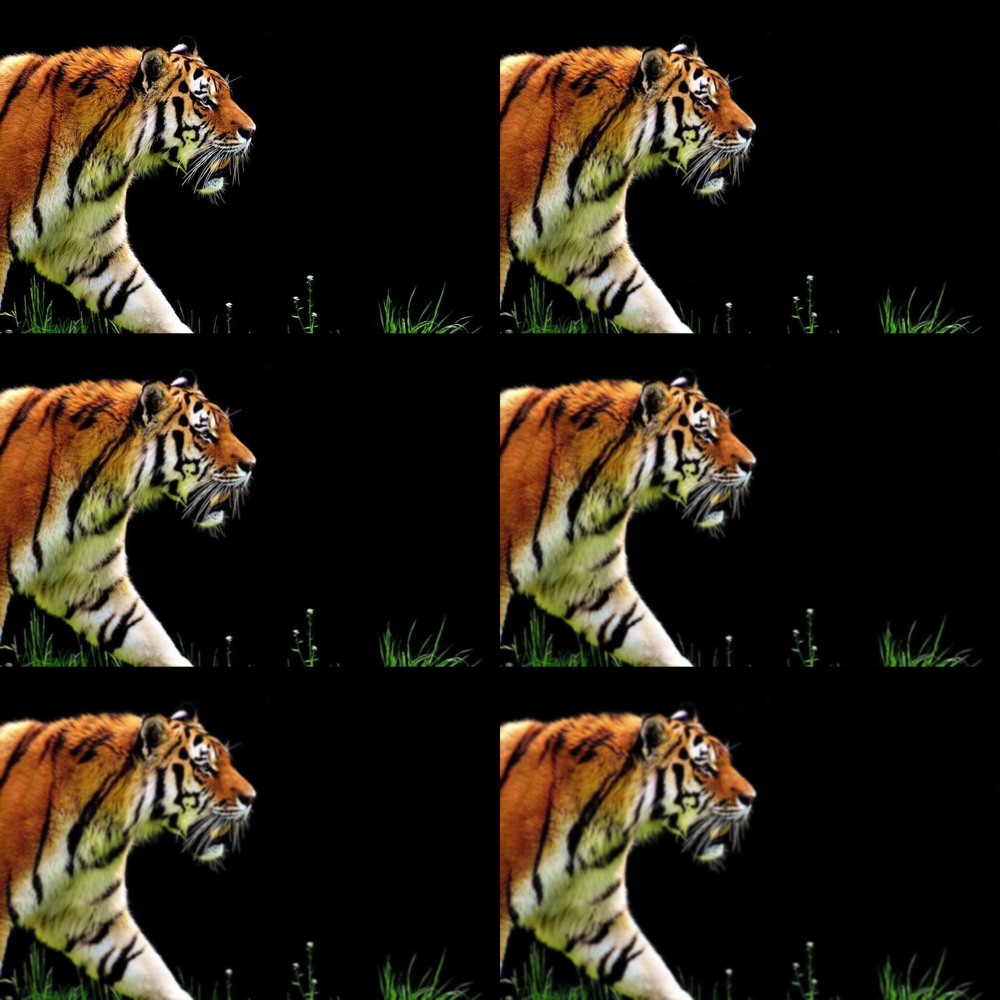

In [6]:
# Aplicando o Gaussiano gradativamente
# tem o efeito de borramento da imagem
img = tigre #lenna, torre, cameraman, tigre

# No código abaixo é aplicado o filtro Gaussiano 5 vezes, nos tamanhos 3x3, 5x5, 7x7, 9x9 e 11x11
# 0 é a borda (ou seja, sem formatação de borda)
Gaussiano = np.vstack([
 np.hstack([img,
 cv2.GaussianBlur(img, (3, 3), 0)]),
 np.hstack([cv2.GaussianBlur(img, ( 5, 5), 0),
 cv2.GaussianBlur(img, (7, 7), 0)]),
 np.hstack([cv2.GaussianBlur(img, ( 9, 9), 0),
 cv2.GaussianBlur(img, (11, 11), 0)]),
 ])

cv2_imshow(Gaussiano)

## Função filter2D()
```
filter2D(src, ddepth, kernel)
```
*  O primeiro argumento é a imagem de origem;
*  O segundo argumento é ddepth, que indica a profundidade da imagem resultante. Um valor de -1 indica que a imagem final também terá a mesma profundidade da imagem de origem;
*  O argumento de entrada final é o kernel, que aplicamos à imagem de origem.






## Filtro Laplaciano

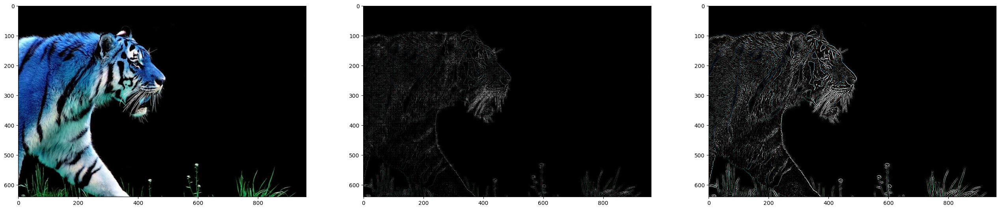

In [7]:
src = tigre #lenna, torre, tigre, cameraman

# Definição de duas máscaras
lp_kernel = np.array([[0, 1, 0],
                    [1,-4, 1],
                    [0, 1, 0]])

lp_kernel4 = np.array([[0, 1, 1, 0],
                      [1,-2, -2, 1],
                      [1,-2, -2, 1],
                      [0, 1, 1, 0]])

result_lp = cv2.filter2D(src=src, ddepth=-1, kernel=lp_kernel)
result_lp4 = cv2.filter2D(src=src, ddepth=-1, kernel=lp_kernel4)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

plt.subplot(1, 3, 1)
plt.imshow(src, cmap="gray")
plt.subplot(1, 3, 2)
plt.imshow(result_lp, cmap="gray")
plt.subplot(1, 3, 3)
plt.imshow(result_lp4, cmap="gray")
plt.show()



##  Filtro de Prewitt

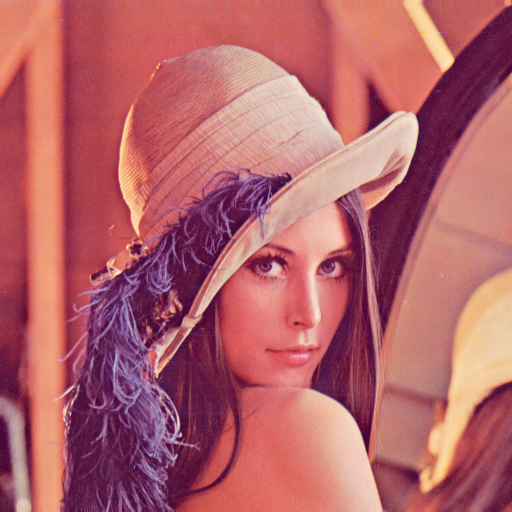

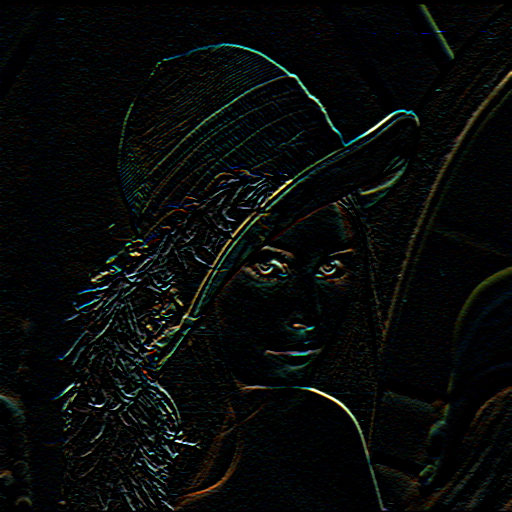

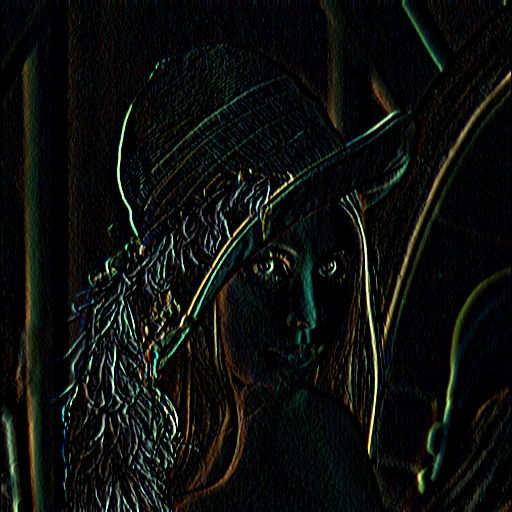

In [8]:
from skimage import filters

image = lenna #lenna, torre, tigre, cameraman

# Filtro de Prewitt - BPF (slide 107)
h_prewitt = np.array([[-1, -1, -1],
                    [0, 0, 0],
                    [1, 1, 1]])
# A função filter2D() pode ser utilizada para aplicar o kernel à imagem
# Onde ddepth é a "profundidade" da imagem final. Se ddepth = -1, terá mesma profundidade que a imagem de referência.
prewittH = cv2.filter2D(src=image, ddepth=-1, kernel=h_prewitt)

h_prewitt2 = np.array([[-1, 0, 1],
                    [-1, 0, 1],
                    [-1, 0, 1]])

prewittV = cv2.filter2D(src=image, ddepth=-1, kernel=h_prewitt2)

cv2_imshow(image)
cv2_imshow(prewittH)
cv2_imshow(prewittV)

## [skimage.filters.prewitt](https://scikit-image.org/docs/stable/api/skimage.filters.html#skimage.filters.prewitt)

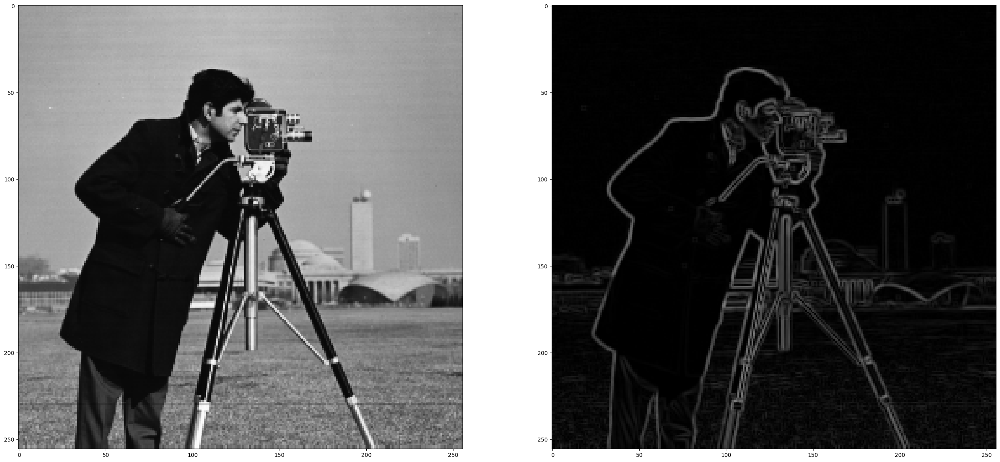

In [9]:
from skimage import data
from skimage import filters
import matplotlib.pyplot as plt

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

image = cameraman #lenna, torre, tigre, cameraman
edges = filters.prewitt(image)

plt.subplot(1, 2, 1)
plt.imshow(image, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(edges, cmap="gray")
plt.show()

## Filtro de Sobel
**Referências**: https://www.bogotobogo.com/python/OpenCV_Python/python_opencv3_Image_Gradient_Sobel_Laplacian_Derivatives_Edge_Detection.php

https://learnopencv.com/edge-detection-using-opencv/#sobel-edge



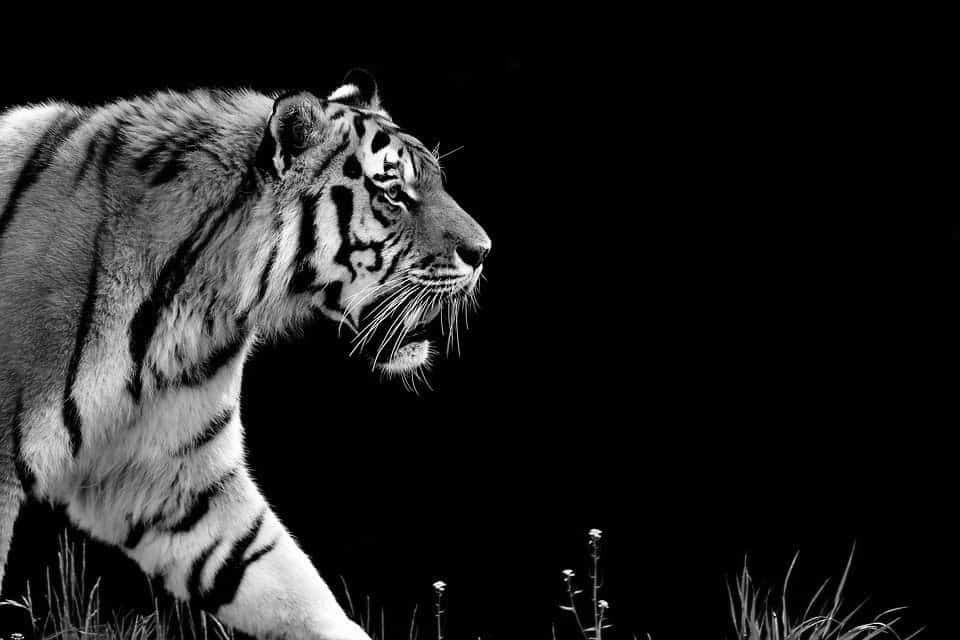

In [10]:
#Pegando imagem na escala de cinza [0]
img = cv2.imread(tigre_path, 0)  # torre_path, lenna_path, cameraman_path, tigre_path
cv2_imshow(img)

Sobel X


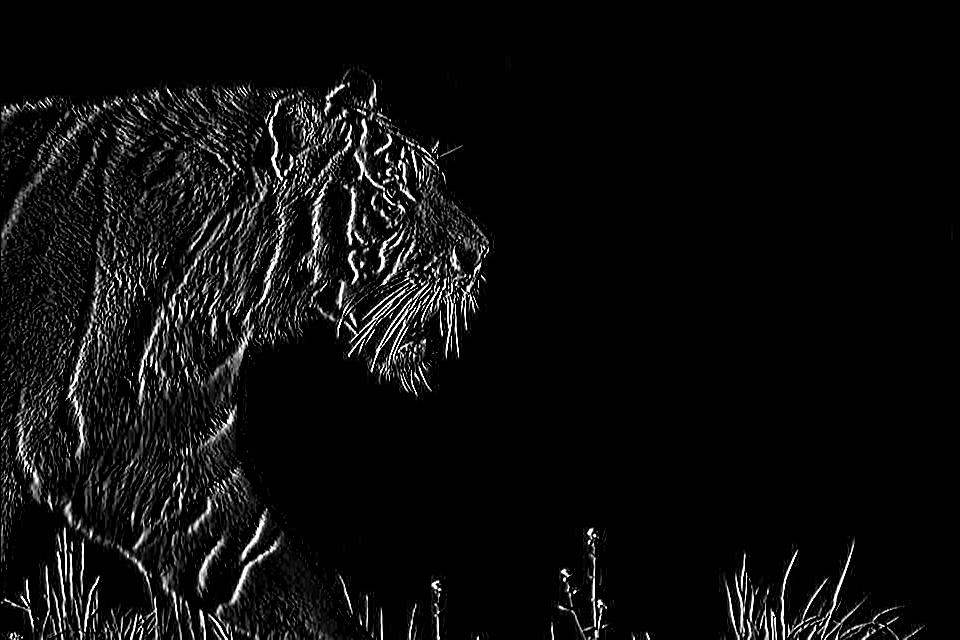

Sobel Y


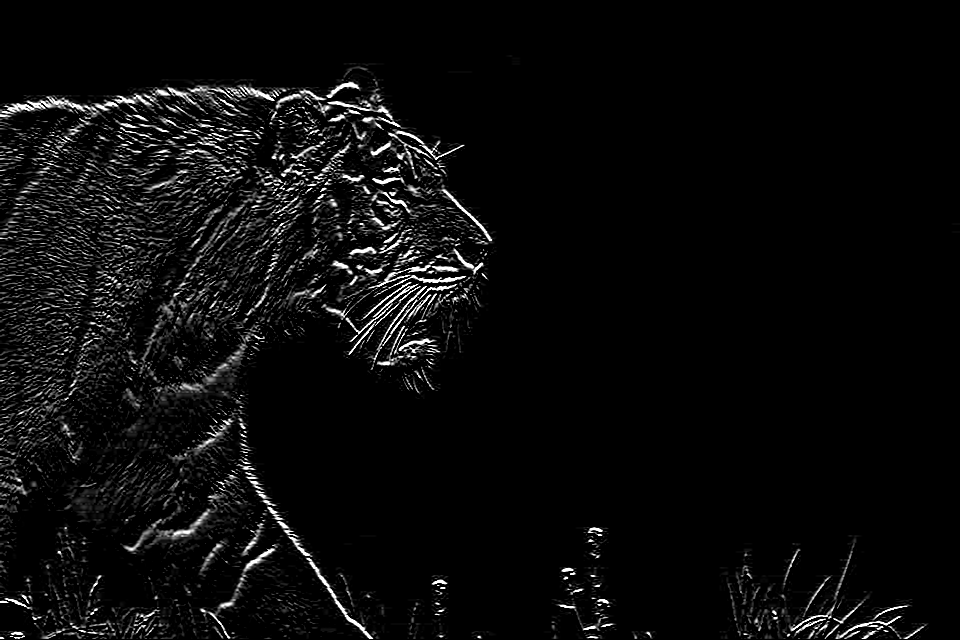

Sobel X Y utilizando a função Sobel()


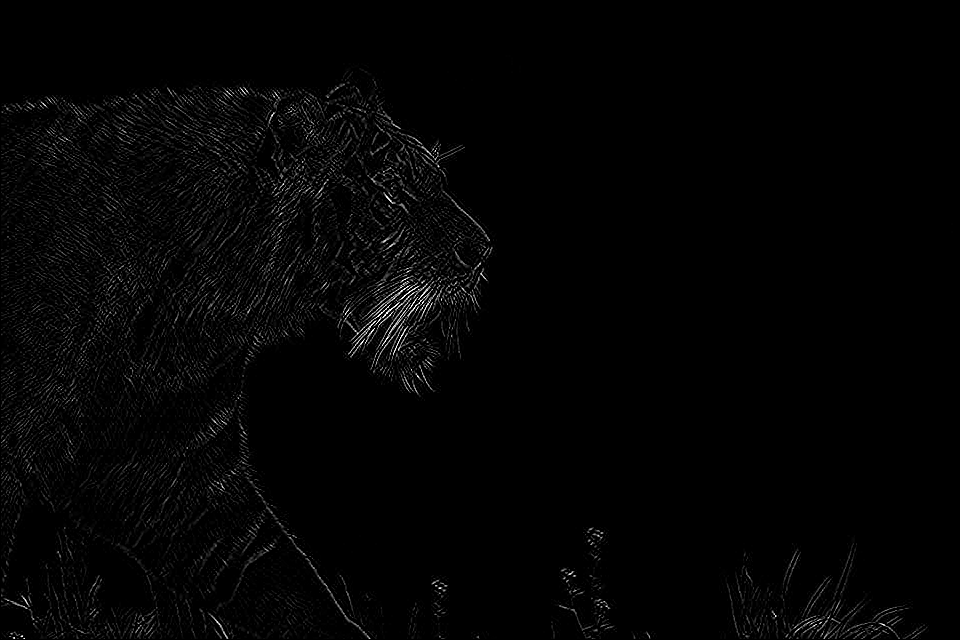

In [11]:
# Sobel: detector de bordas
sobelx = cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=1, dy=0) # Sobel Edge Detection on the X axis
sobely = cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=0, dy=1) # Sobel Edge Detection on the Y axis
sobelxy = cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=1, dy=1) # Combined X and Y Sobel Edge Detection

# Exibindo detector de bordas de Sobel
print('Sobel X')
cv2_imshow(sobelx)

print('Sobel Y')
cv2_imshow(sobely)

print('Sobel X Y utilizando a função Sobel()')
cv2_imshow(sobelxy)

## Filtro de Média

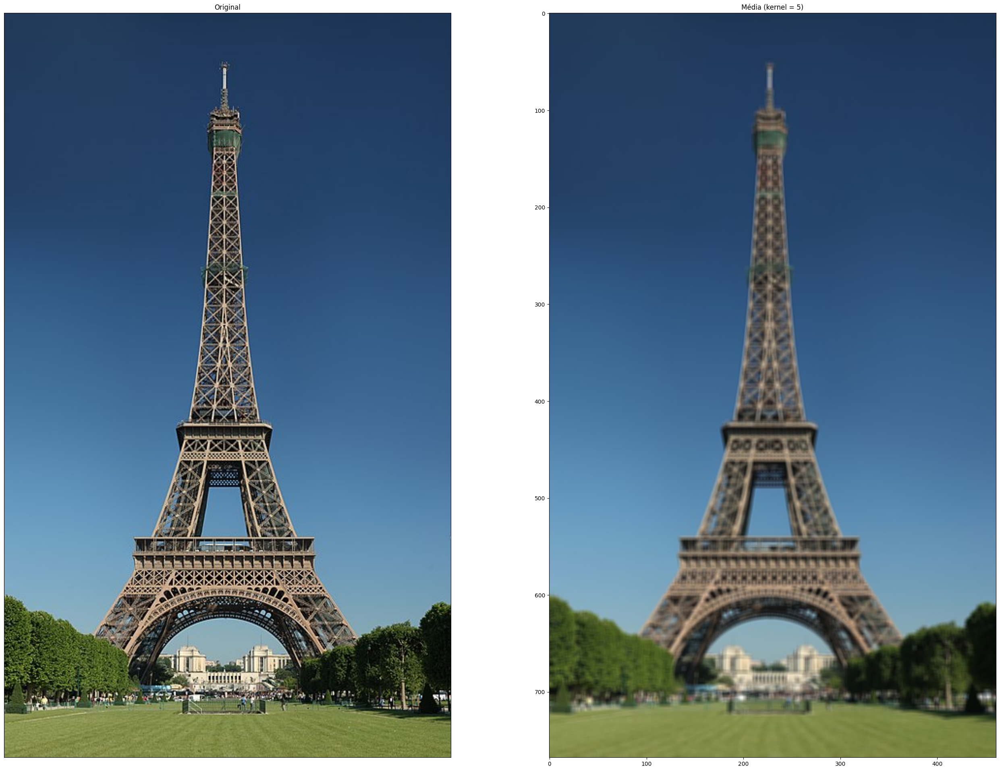

In [12]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
from skimage.data import *

img = torre #lenna, torre, tigre, cameraman
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) #Migrando para RGB pois plotando com matplotlib

dst1 = cv2.blur(img,(5,5))
dst2 = cv2.blur(img,(11,11))

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst1),plt.title('Média (kernel = 5)') #dst2
plt.show()

## Filtro de Mediana

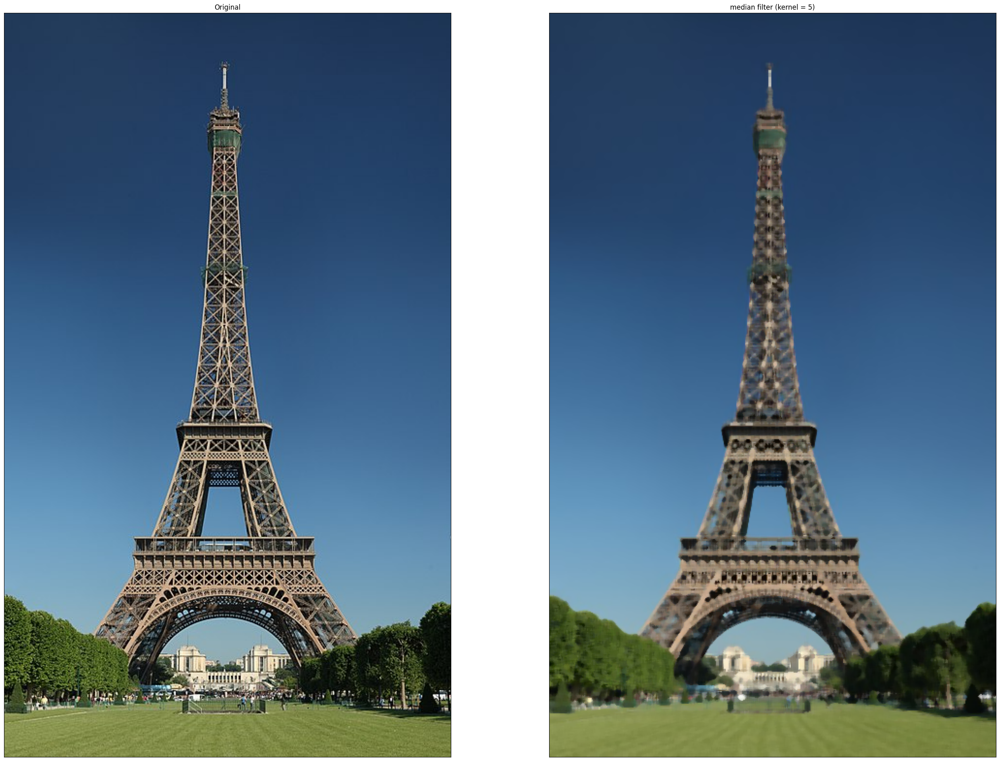

In [13]:
#import numpy as np
#import cv2
#from matplotlib import pyplot as plt

img = torre #lenna, torre, tigre, cameraman
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) #Migrando para RGB pois plotando com matplotlib

dst = cv2.medianBlur(img,ksize=5)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst),plt.title('median filter (kernel = 5)')
plt.xticks([]), plt.yticks([])
plt.show()

#Para executar este Notebook:

- Adicione ao seu Drive as imagens [AQUI](https://drive.google.com/drive/folders/15FUG0Igsre7Vo6aABQocTJv90loAsbsR?usp=sharing) disponibilizadas;
- Edite os caminhos das Imagens para o seu diretório.

Este Notebook está diponível apenas para leitura. Para implementação e edição crie uma cópia (Arquivo -> Salvar uma cópia).

#Referências:

- Filtros Domínio espacial: [COLAB](https://colab.research.google.com/drive/15-D2UhoYSCe-AGVtxiiBDBxmxxLARyRT?authuser=1)

- Denoising a picture: [LINK](https://scikit-image.org/docs/stable/auto_examples/filters/plot_denoise.html#sphx-glr-auto-examples-filters-plot-denoise-py/)

- Filtro Laplaciano: [cv2.Laplacian()](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#gad78703e4c8fe703d479c1860d76429e6)

- Filtros em cascata: [LINK](https://docs.opencv.org/3.4/Laplace_Operator_Tutorial_Original_Image.jpg)

- Filtro de Média: [LINK](https://docs.opencv.org/3.4/d4/d13/tutorial_py_filtering.html)